# Computing Halo Orbits and Their Invariant Manifolds
Halo orbits are a subset of the much larger set of periodic orbits in the CR3BP. There are many varieties of periodic orbit, but halo orbits have proven to be very useful in several NASA missions, including the James Webb Space Telescope.

In [18]:
@time using ThreeBodyProblem
@time using OrdinaryDiffEq
@time using Plots
@time using LinearAlgebra
@time using PolynomialRoots # needed for Richardson expansion

  0.000071 seconds (99 allocations: 7.859 KiB)
  0.000040 seconds (99 allocations: 7.844 KiB)
  0.000040 seconds (99 allocations: 7.844 KiB)
  0.000036 seconds (99 allocations: 7.844 KiB)
  0.000060 seconds (99 allocations: 7.844 KiB)


## Initial Guess at a Halo Orbit 
We can use differential correction to compute a Halo orbit, but only if we have a really good first guess. We could start from the Lagrange point and perturb in the planar and out-of-plane directions, similar to what we did for the Lyapunov Orbits. However, we can also generate a first guess using an expansion method. This gives the advantage of allowing us to select the size of our orbit without having to start at a small orbit and continuing up the family. We'll generate a first guess using Richardson's expansion. The details are complicated, but if you're curious check out this paper *D. L. Richardson, “Analytic Construction Of Periodic Orbits About The Collinear Points,” Celest. Mech., vol. 22, no. 3, pp. 241–253, 1980, doi: 10.1007/BF01229511.*

In [19]:
"""
   γ = gammaL(sys::System, Lpt::Int)

Calculate the ratio of Lagrange point distance from closest primary to distance between two primaries
"""
function gammaL(sys::System, Lpt::Int)
    μ = sys.μ

    # poly1 = [1, -1*(3-μ), (3-2*μ),     -μ,      2*μ,     -μ];
    # poly2 = [1,    (3-μ), (3-2*μ),     -μ,     -2*μ,     -μ];
    # poly3 = [1,    (2+μ), (1+2*μ), -(1-μ), -2*(1-μ), -(1-μ)];

    poly1 = [    -μ,      2*μ,     -μ, (3-2*μ), -1*(3-μ), 1];
    poly2 = [    -μ,     -2*μ,     -μ, (3-2*μ),    (3-μ), 1];
    poly3 = [-(1-μ), -2*(1-μ), -(1-μ), (1+2*μ),    (2+μ), 1];

    rt1 = roots(poly1)
    rt2 = roots(poly2)
    rt3 = roots(poly3)

    Γ = zeros(3)
    for i=1:5
        if isreal(rt1[i]) Γ[1]=rt1[i]; end
        if isreal(rt2[i]) Γ[2]=rt2[i]; end
        if isreal(rt3[i]) Γ[3]=rt3[i]; end
    end
    γ = Γ[Lpt];
end

"""
    rich3(sys::System, Az, Lpt, NS, npts=10)

Richardson expansion for a periodic orbit in the CR3BP with z-amplitude Az, centered around Lagrange point Lpt.
NS indicates whether the family is north (1) or south (3), and npts is the number of points per step.
"""
function rich3(sys::System, Az, Lpt, NS, npts=10)
    μ = sys.μ
    γ = gammaL(sys, Lpt)

    if Lpt == 1;        won =  1;   primary = 1-μ;
    elseif Lpt == 2;    won = -1;   primary = 1-μ;
    elseif Lpt == 3;    won =  1;   primary = -μ;
    end

    c = zeros(4)

    if Lpt == 3
      for N = 2:4
        c[N]= (1/γ^3)*( 1-μ + (-primary*γ^(N+1))/((1+γ)^(N+1)) );
      end
    else
      for N = 2:4
        c[N]= (1/γ^3)*( (won^N)*μ + ((-1)^N)*((primary)*γ^(N+1))/((1+(-won)*γ)^(N+1)) );
      end
    end

    # polylambda = [1, 0, (c[2]-2), 0, -(c[2]-1)*(1+2*c[2])];
    polylambda = [-(c[2]-1)*(1+2*c[2]), 0, c[2]-2, 0, 1];
    lambdaroots = roots(polylambda); # lambda = frequency of orbit
    ## Stuck here 6/22/21 (need to select the right root)
    λ = real(sort(lambdaroots, by = x -> abs(imag(x))))[1]

    # if Lpt==3
    #    λ = lambdaroots[1];
    # else
    #    λ = lambdaroots[1];
    # end

    k   = 2*λ/(λ^2 + 1 - c[2]);


    del = λ^2 - c[2];

    d1  = ((3*λ^2)/k)*(k*( 6*λ^2 -1) - 2*λ);
    d2  = ((8*λ^2)/k)*(k*(11*λ^2 -1) - 2*λ);

    a21 = (3*c[3]*(k^2 - 2))/(4*(1 + 2*c[2]));
    a22 = 3*c[3]/(4*(1 + 2*c[2]));
    a23 = -(3*c[3]*λ/(4*k*d1))*( 3*(k^3)*λ - 6*k*(k-λ) + 4);
    a24 = -(3*c[3]*λ/(4*k*d1))*( 2 + 3*k*λ );

    b21 = -(3*c[3]*λ/(2*d1))*(3*k*λ - 4);
    b22 = 3*c[3]*λ/d1;
    d21 = -c[3]/(2*λ^2);

    a31 = -(9*λ/(4*d2))*(4*c[3]*(k*a23 - b21) + k*c[4]*(4 + k^2)) + ((9*λ^2 + 1 -c[2])/(2*d2))*(3*c[3]*(2*a23 - k*b21) + c[4]*(2 + 3*k^2));
    a32 = -(1/d2)*( (9*λ/4)*(4*c[3]*(k*a24 - b22) + k*c[4]) + 1.5*(9*λ^2 + 1 - c[2])*( c[3]*(k*b22 + d21 - 2*a24) - c[4]) );

    b31 = (.375/d2)*( 8*λ*(3*c[3]*(k*b21 - 2*a23) - c[4]*(2 + 3*k^2)) + (9*λ^2 + 1 + 2*c[2])*(4*c[3]*(k*a23 - b21) + k*c[4]*(4 + k^2)) );
    b32 = (1/d2)*( 9*λ*(c[3]*(k*b22 + d21 - 2*a24) - c[4]) + .375*(9*λ^2 + 1 + 2*c[2])*(4*c[3]*(k*a24 - b22) + k*c[4]) );

    d31 = (3/(64*λ^2))*(4*c[3]*a24 + c[4]);
    d32 = (3/(64*λ^2))*(4*c[3]*(a23- d21) + c[4]*(4 + k^2));

    s1  = (1/(2*λ*(λ*(1+k^2) - 2*k)))*( 1.5*c[3]*(2*a21*(k^2 - 2)-a23*(k^2 + 2) - 2*k*b21) - .375*c[4]*(3*k^4 - 8*k^2 + 8) );
    s2  = (1/(2*λ*(λ*(1+k^2) - 2*k)))*( 1.5*c[3]*(2*a22*(k^2 - 2)+a24*(k^2 + 2) + 2*k*b22 + 5*d21) + .375*c[4]*(12 - k^2) );

    a1  = -1.5*c[3]*(2*a21+ a23 + 5*d21) - .375*c[4]*(12-k^2);
    a2  =  1.5*c[3]*(a24-2*a22) + 1.125*c[4];

    l1 = a1 + 2*(λ^2)*s1;
    l2 = a2 + 2*(λ^2)*s2;

    # ADDITIONAL TERMS FROM GEOMETRY CENTER PAPER
    b33 = -k/(16*λ)*(12*c[3]*(b21-2*k*a21+k*a23)+3*c[4]*k*(3*k^2-4)+16*s1*λ*(λ*k-1));
    b34 = -k/(8*λ)*(-12*c[3]*k*a22+3*c[4]*k+8*s2*λ*(λ*k-1));
    b35 = -k/(16*λ)*(12*c[3]*(b22+k*a24)+3*c[4]*k);

    deltan = 2 - NS;

    Ax  = sqrt( (-del - l2*Az^2)/l1 );
    omg = 1+s1*Ax^2+s2*Az^2;
    freq=λ*omg;
    period=2*pi/freq;

    rvi  = zeros(npts,6);
    ss   = zeros(npts,1);
    if npts > 1
       dtau1= 2*pi/(npts-1);
    else
       dtau1= 2*pi;
    end
    tau1 = 0;
    for i=1:npts
       x = a21*Ax^2 + a22*Az^2 - Ax*cos(tau1) + (a23*Ax^2 - a24*Az^2)*cos(2*tau1) + (a31*Ax^3 - a32*Ax*Az^2)*cos(3*tau1);
       y = k*Ax*sin(tau1) + (b21*Ax^2 - b22*Az^2)*sin(2*tau1) + (b31*Ax^3 - b32*Ax*Az^2)*sin(3*tau1);
       z = deltan*Az*cos(tau1) + deltan*d21*Ax*Az*(cos(2*tau1) - 3) + deltan*(d32*Az*Ax^2 - d31*Az^3)*cos(3*tau1);
       y_plus = (b33*Ax^3 + b34*Ax*Az^2 - b35*Ax*Az^2)*sin(tau1);
       y = y + y_plus;     # ADD EXTRA TERMS FROM G.C. PAPER

       xdot = freq*Ax*sin(tau1) - 2*freq*(a23*Ax^2-a24*Az^2)*sin(2*tau1) - 3*freq*(a31*Ax^3 - a32*Ax*Az^2)*sin(3*tau1);
       ydot = freq*(k*Ax*cos(tau1) + 2*(b21*Ax^2 - b22*Az^2)*cos(2*tau1) + 3*(b31*Ax^3 - b32*Ax*Az^2)*cos(3*tau1));
       zdot = - freq*deltan*Az*sin(tau1) - 2*freq*deltan*d21*Ax*Az*sin(2*tau1) - 3*freq*deltan*(d32*Az*Ax^2 - d31*Az^3)*sin(3*tau1);
       ydot_plus = freq*(b33*Ax^3 + b34*Ax*Az^2 - b35*Ax*Az^2)*cos(tau1);
       ydot = ydot_plus + ydot; # ADD EXTRA TERMS FROM G.C. PAPER

       rvi[i,:]= γ*[ (primary+γ*(-won+x))/γ, y, z, xdot, ydot, zdot];
       ss[i]   = tau1/freq;
       tau1=tau1+dtau1;
    end

    return ss, rvi, period, Ax
end

rich3

### Let's work in the Sun-Mars system

In [20]:
sys = sun_earth() # Sun-Mars CR3BP system

System(Body(1.98847e30, 695700.0, 0.0, 0.0, "Sun", :yellow), Body(5.97237e24, 6371.0084, 1.495978976276167e8, 3.155814910224e7, "Earth", :blue), 1.495978976276167e8, 3.155814910224e7, 1.3271645321e11, 398613.89090999996, 3.0034911575429927e-6, 695700.0, 6371.0084, 1.3271645321e11, 398613.89090999996, 3.0034911575429927e-6, 695700.0, 6371.0084, 1.98847597237e30, 1.495978976276167e8, 5.022635424452555e6, 29.784741472435698, 5.930102218335328e-6, "Sun/Earth")

The ```rich3()``` function takes in a ```System()``` object as well as the amplitude of the orbit in the z-direction, the Lagrange point about which the halo orbit lies, and an indicator of which family (north or south) to compute. It outputs the time steps and states of the approximation along with the approximate period and amplitude of the orbit in the x-direction.

In [21]:
Az = 0.001 # The amplitude of the orbit in the z direction
Lpt = 2 # Which libration point will I center about
NS = 1 # North-South flag
npts = 100 # number of points in approximation
t, rvs, T, Ax = rich3(sys, Az, Lpt, NS, npts); # time steps and state vectors of approximation along with Period and amplitude in x direction

### Let's plot the approximate orbit

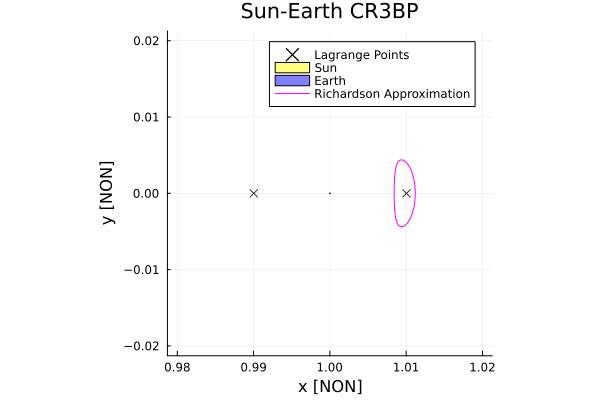

In [22]:
p_rich = plot(sys) # plot the system
xlims, ylims, zlims = seczoom(sys, N=500) # zoom in on the section
plot!(p_rich, rvs[:,1],rvs[:,2],label="Richardson Approximation",linecolor=:magenta, xlim=xlims, ylim=ylims, zlim=zlims, title="Sun-Earth CR3BP", xlabel="x [NON]", ylabel="y [NON]", zlabel="z [NON]")

### Remember, this is a third order approximation. What will happen if we actually integrate this trajectory for a period?

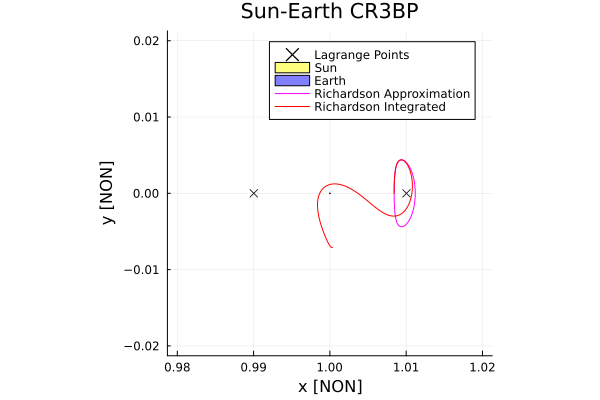

In [23]:
tspan = (0., abs(T)) # time span of integration for one period
prob_rich = ODEProblem(CR3BPdynamics!,rvs[1,:],tspan,sys) # ODE problem with first point along orbit as initial condition
sol_rich = solve(prob_rich, TsitPap8(), reltol=1e-12, abstol=1e-12) # solve the ODE problem
plot!(p_rich,sol_rich,idxs=(1,2),label="Richardson Integrated",linecolor=:red, xlim=xlims, ylim=ylims, zlim=zlims, flip=false)

We can see that this orbit diverges before completing a period. We need to use a differential corrector to hone in on the true periodic orbit. We can use the same differential corrector we derived in the last example.

In [24]:
"""
   differential_corrector(sys::System, rv₀; myconst=3, iter=100, plot=false, t0=0., tf=1., dir=1, tol=1e-12)

Given a sufficiently close guess at a periodic trajectory rv₀, returns the corrected initial condition and period
"""
function differential_corrector(sys::System, rv₀; myconst=3, iter=100, plot=false, t0=0., tf=1., dir=1, tol=1e-12)
   Φ₀ = I(6)

   tspan = (t0, tf)

   # event function
   condition(u, t, integrator) = u[2]
   affect!(integrator) = terminate!(integrator)
   if dir == 1 # stop when passing through from + to -
    cb = OrdinaryDiffEq.ContinuousCallback(condition, nothing, affect!)
elseif dir == -1 # stop when passing through from - to +
    cb = OrdinaryDiffEq.ContinuousCallback(condition, affect!, nothing)
elseif dir == 0 # stop when passing through either direction
      cb = DiscreteCallback(condition, affect!)
   end

   sol_iters = []

   for k = 1:iter
      w₀ = vcat(rv₀, reshape(Φ₀,36,1))

      prob = ODEProblem(CR3BPstm!,w₀,tspan,sys)
      sol = solve(prob, TsitPap8(), abstol=1e-12, reltol=1e-12, callback=cb)
      push!(sol_iters, sol)

      w = sol[end] # final state and STM
      rv = w[1:6] # final state
      Φ = reshape(w[7:42],6,6)
      global T = 2*sol.t[end]

      ∂ẋ = 0 - rv[4]
      ∂ż = 0 - rv[6]
      err = norm([∂ẋ, ∂ż])
      # @info("Iter: $k, Differential corrector error: $err")
      if err < tol
         # @info("Differential corrector converged")
         break
      end

      if k == iter
         @warn("Iter: $k, Differential corrector did not converge")
      end

      ẋ,ẏ,ż,ẍ,ÿ,z̈ = CR3BPdynamics(rv, sys, 0) # take time derivative of final state

      if myconst == 1
         ∂Φ = [Φ[4,3] Φ[4,5];
               Φ[6,3] Φ[6,5]]
         dyad = [ẍ;z̈]*[Φ[2,3] Φ[2,5]]

         ∂z, ∂ẏ = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[3] += ∂z
         rv₀[5] += ∂ẏ
      elseif myconst == 3
         ∂Φ = [Φ[4,1] Φ[4,5];
               Φ[6,1] Φ[6,5]]
         dyad = [ẍ;z̈]*[Φ[2,1] Φ[2,5]]

         ∂x, ∂ẏ = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[1] += ∂x
         rv₀[5] += ∂ẏ
      elseif myconst == 5
         ∂Φ = [Φ[4,1] Φ[4,3];
               Φ[6,1] Φ[6,3]]
         dyad = [ẍ;z̈]*[Φ[2,1] Φ[2,5]]

         ∂x, ∂z = (∂Φ - dyad/ẏ)\[∂ẋ; ∂ż]
         rv₀[1] += ∂x
         rv₀[3] += ∂z
      else
         error("myconst should be 1, 3, or 5")
      end

   end

   return rv₀, T, sol_iters
end

differential_corrector

In [25]:
rv₀, T = differential_corrector(sys, rvs[1,:], myconst=3, dir=1, tf=abs(T), tol=1e-10); # correct the initial condition

Now that we've corrected our initial condition, when we integrate the orbit, it returns to its initial state.

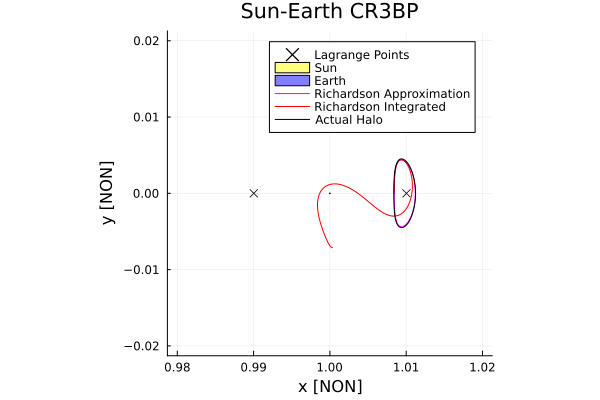

In [26]:
tspan = (0., T) # time span of integration for one period
prob_halo = ODEProblem(CR3BPdynamics!,rv₀,tspan,sys) # ODE problem with first point along orbit as initial condition
sol_halo = solve(prob_halo, TsitPap8()) # solve the ODE problem
plot!(p_rich, sol_halo, idxs=(1,2), linecolor=:black, label="Actual Halo", xlim=xlims, ylim=ylims, zlim=zlims, flip=false) # plot the orbit

Our corrected orbit matches up nicely with the Richardson approximation and doesn't diverge when integrated for a full period.

## Compute Invariant Manifolds
Now we compute the stable and unstable manifolds of the halo orbit, similar to what we did for the Lagrange points. However, there is a slight difference. For the Lagrange points, we were able to take the Jacobian of the dynamics and use an eigenvalue decomposition to find the stable and unstable modes. For a periodic orbit, we must use the Monodromy matrix to determine the stable and unstable modes.

### Monodromy Matrix
The monodromy matrix is defined as the state transition matrix (STM) of a periodic orbit computed over one period.
\begin{align}
    \mathbf{\Phi}_T &= \mathbf{\Phi}(T,0).
\end{align}

Let's compute the monodromy matrix for our halo orbit.

In [27]:
Φ₀ = I(6) # initial STM
w₀ = vcat(rv₀,reshape(Φ₀,36,1)) # augmented state vector
tspan = (0.,T) # time span of integration for one period
prob_monodromy = ODEProblem(CR3BPstm!,w₀,tspan,sys) # ODE problem
sol_monodromy = solve(prob_monodromy, TsitPap8()) # solve the ODE problem
Φₜ = Matrix(reshape(sol_monodromy.u[end][7:42],6,6))

6×6 Matrix{Float64}:
  1270.9        -47.3195      0.980993    …   232.861      0.13749
 -1114.87        42.435      -0.860302       -204.531     -0.120487
     0.656827    -0.0249426   1.00051           0.120486  -0.0841154
  3849.17      -143.093       2.97364         705.806      0.415858
 -2313.83        86.2191     -1.78743        -423.288     -0.250037
     4.69423     -0.174555    0.00363096  …     0.860297   1.00051

Now let's compute the eigenvalues of the monodromy matrix to see what kind of modes we have.

In [28]:
Λ, V = eig(Φₜ) # eigenvalues and eigenvectors of the STM (sorted in order of stable, unstable, identity, periodic)
Λ

6-element Vector{ComplexF64}:
 0.0005905915978443718 + 0.0im
     1693.221526323991 + 0.0im
    0.9999995841173224 - 1.8081357458731443e-5im
    0.9999995841173224 + 1.8081357458731443e-5im
    0.9999979078294898 - 0.0014760741853899067im
    0.9999979078294898 + 0.0014760741853899067im

We can see that we have two real eigenvalues while the others are complex. The real eigenvalues represent the stable and unstable modes of the periodic orbit. Each eigenvalue corresponds to an eigenvector. If we perturb in the direction of the stable and unstable eigenvectors, then we will have approximated the stable and unstable manifolds.

the ```eig()``` function sorts the eigenvalues and eigenvectors such that the stable and unstable modes are indices 1 and 2 respectively.

In [29]:
vs = real(V[:,1]) # stable direction
vu = real(V[:,2]) # unstable direction
# we use the real part of the eigenvectors because the imaginary part is zero, and we wish to save memory

6-element Vector{Float64}:
  0.2648644898231116
 -0.2322004917525805
  0.00013697055936863042
  0.8018895118608685
 -0.4825991802591661
  0.0009782026310561358

The unstable manifold is the set of trajectories that diverge from the periodic orbit, so we will integrate the unstable manifold forward in time. Conversely, the stable manifold is the set of trajectories that converge to the periodic orbit, so we need to integrate the stable manifold backwards in time to see where it came from.

In [30]:
tf = 2T # time span of integration for unstable and stable manifolds
tspan_forward = (0., tf) # time span of integration for unstable manifold
tspan_backward = (0., -tf) # time span of integration for stable manifold

(0.0, -6.205047520626621)

Let's add an event function to stop if we reach the x-value of the secondary body

In [31]:
condition(u, t, integrator) = u[1] - (1-sys.μ) # stop when x = 1 - μ
affect!(integrator) = terminate!(integrator) # stop the integration
cb = OrdinaryDiffEq.ContinuousCallback(condition, affect!) # callback function

ContinuousCallback{…}(condition, affect!, affect!, SciMLBase.INITIALIZE_DEFAULT, SciMLBase.FINALIZE_DEFAULT, nothing, SciMLBase.LeftRootFind, 10, Bool[1, 1], 1, 2.220446049250313e-15, 0, 1//100)

Let's make some empty containers to hold the manifold trajectories. We'll perturb in the positive and negative directions for both the stable and unstable manifolds.

In [32]:
Wsp = [] # stable manifold perturbed in positive direction
Wsn = [] # stable manifold perturbed in negative direction
Wup = [] # unstable manifold perturbed in positive direction
Wun = [] # unstable manifold perturbed in negative direction

Any[]

Now we'll perturb several points along the orbit by adding or subtracting the stable or unstable direction vector multiplied by a small scaling parameter α. We compute the stable and unstable directions at each point by using the approximation
\begin{align}
\vec{v}_t = \mathbf{\Phi}(t, 0)\vec{v}
\end{align}

In [33]:
nPts = 100 # number of trajectories to compute on each manifold
α = 1e-6 # perturbation step size
for t = LinRange(0,T,nPts) # equally space the points along the orbit in time
    Φ = Matrix(reshape(sol_monodromy(t)[7:42],6,6)) #
    rv0sp = sol_monodromy(t)[1:6] + α*Φ*vs/norm(Φ*vs); # perturb the initial condition along the positive stable direction
    rv0sn = sol_monodromy(t)[1:6] - α*Φ*vs/norm(Φ*vs); # perturb the initial condition along the negative stable direction
    rv0up = sol_monodromy(t)[1:6] + α*Φ*vu/norm(Φ*vu); # perturb the initial condition along the positive unstable direction
    rv0un = sol_monodromy(t)[1:6] - α*Φ*vu/norm(Φ*vu); # perturb the initial condition along the negative unstable direction

    prob_sp = ODEProblem(CR3BPdynamics!,rv0sp, tspan_backward, sys) # stable positive
    push!(Wsp, solve(prob_sp, TsitPap8(), callback=cb))
    prob_sn = ODEProblem(CR3BPdynamics!,rv0sn, tspan_backward, sys) # stable negative
    push!(Wsn, solve(prob_sn, TsitPap8(), callback=cb))
    prob_up = ODEProblem(CR3BPdynamics!,rv0up, tspan_forward, sys) # unstable positive
    push!(Wup, solve(prob_up, TsitPap8(), callback=cb))
    prob_un = ODEProblem(CR3BPdynamics!,rv0un, tspan_forward, sys) # unstable negative
    push!(Wun, solve(prob_un, TsitPap8(), callback=cb))
 end

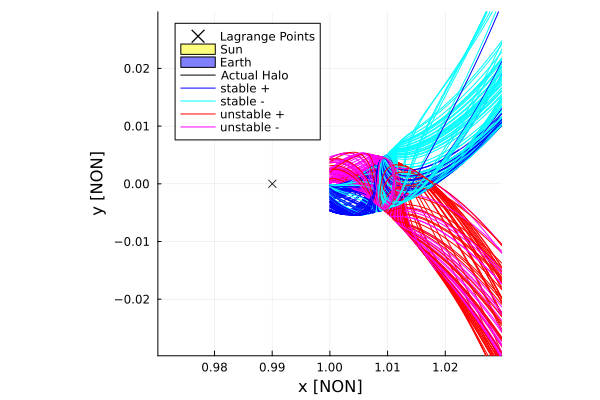

In [34]:
p_man = plot(sys) # plot the system
xlims, ylims, zlims = seczoom(sys, N=700) # zoom in on the section
plot!(p_man, sol_halo, idxs=(1,2), linecolor=:black, label="Actual Halo") # plot the orbit

plot!(p_man, Wsp[1],vars=(1,2),label="stable +",linecolor=:blue)
plot!(p_man, Wsn[1],vars=(1,2),label="stable -",linecolor=:cyan)
plot!(p_man, Wup[1],vars=(1,2),label="unstable +",linecolor=:red)
plot!(p_man, Wun[1],vars=(1,2),label="unstable -",linecolor=:magenta)
for i = 2:length(Wsp)
    plot!(p_man, Wsp[i],vars=(1,2),label="",linecolor=:blue)
    plot!(p_man, Wsn[i],vars=(1,2),label="",linecolor=:cyan)
    plot!(p_man, Wup[i],vars=(1,2),label="",linecolor=:red)
    plot!(p_man, Wun[i],vars=(1,2),label="",linecolor=:magenta)
end
plot!(p_man, xlim=xlims, ylim=ylims, zlim=zlims, flip=false)

Now we've computed a halo orbit and its manifolds. The stable manifolds are the most efficient way to get a spacecraft into the halo orbit while the unstable manifolds are the most efficient way to leave the halo orbit.